**PROJETO ANÁLISE DE DADOS DO AIRBNB**
_____________________________

Integrantes:

*   Beatriz de Mattos Porto;
*   Eduardo Mattana;
*   Michel Camargo;
*   Pedro Henrique Sena Lima;
*   Rubens Sousa.


# **Metodologia**

## **1) Entendendo o problema**

Airbnb é um mercado online e empresa de corretagem de serviços de hospedagem com sede em São Francisco na Califórnia, Estados Unidos. Os usuários podem utilizar o serviço para organizar ou oferecer hospedagem, casas de família ou experiências turísticas.

O preço de reserva das propriedades varia de acordo com vários atributos como localização, tipo de propriedade, tamanho, número de quartos, comodidades, dia da semana e mês do ano, etc. O Airbnb disponibilizou publicamente seu conjunto de dados sobre listagens de propriedades no Rio de Janeiro em alguns meses de 2023 e 2024. Nosso objetivo é estudar esse conjunto de dados para entender quais são as principais tendências de preços ao longo do ano e nos bairros do Rio de Janeiro.

Responderemos algumas perguntas como:
- Qual a quantidade de reservas total por período?
- Qual a relação de preços das locações e do bairro?
- Existe alguma relação entre o preço e os reviews?
- Quais os bairros mais procurados para locação no RJ?
- Existem anuncios que não estão disponíveis para serem alugados pelo airbnb?
- Os hosts com maior número de locações representam um valor expressivo ou não?


## **2) Entendendo os dados**




### 2.1. Setup

In [ ]:
import pandas as pd # type: ignore
import numpy as np # type: ignore
import requests # type: ignore
from io import StringIO
from io import BytesIO
import string
import plotly.express as px # type: ignore
import plotly.graph_objects as go # type: ignore
import matplotlib.pyplot as plt # type: ignore
import matplotlib.pyplot as plt # type: ignore
import seaborn as sns # type: ignore
from matplotlib.dates import MonthLocator, DateFormatter # type: ignore
import plotly.express as px # type: ignore

In [ ]:
file_url = "https://raw.githubusercontent.com/mxthunder123/An-lise-Airbnb/refs/heads/master/listings_09_2023.csv"

response = requests.get(file_url)

if response.status_code == 200:
    #file_content = response.text

    # Criando um DataFrame pandas a partir do conteúdo do arquivo
    df_09_23  = pd.read_csv(BytesIO(response.content))
else:
    print(f"Erro ao obter o arquivo: {response.status_code}")

df_09_23["mes/ano"] = "09/2023"

In [ ]:
file_url = "https://raw.githubusercontent.com/mxthunder123/An-lise-Airbnb/refs/heads/master/listings_12_2023.csv"
response = requests.get(file_url)

if response.status_code == 200:
    #file_content = response.text

    # Criando um DataFrame pandas a partir do conteúdo do arquivo
    df_12_23  = pd.read_csv(BytesIO(response.content))
else:
    print(f"Erro ao obter o arquivo: {response.status_code}")

df_12_23["mes/ano"] = "12/2023"

In [ ]:
file_url = "https://raw.githubusercontent.com/mxthunder123/An-lise-Airbnb/refs/heads/master/listings_03_2024.csv"

response = requests.get(file_url)

if response.status_code == 200:
    #file_content = response.text

    # Criando um DataFrame pandas a partir do conteúdo do arquivo
    df_03_24  = pd.read_csv(BytesIO(response.content))
else:
    print(f"Erro ao obter o arquivo: {response.status_code}")

df_03_24["mes/ano"] = "03/2024"

In [ ]:
file_url = "https://raw.githubusercontent.com/mxthunder123/An-lise-Airbnb/refs/heads/master/listings_07_2024.csv"

response = requests.get(file_url)

if response.status_code == 200:
    #file_content = response.text

    # Criando um DataFrame pandas a partir do conteúdo do arquivo
    df_06_24  = pd.read_csv(BytesIO(response.content))
else:
    print(f"Erro ao obter o arquivo: {response.status_code}")

df_06_24["mes/ano"] = "06/2024"

In [ ]:
listings_completo = pd.concat([df_09_23,df_12_23,df_03_24,df_06_24], axis=0, ignore_index=True)

### 2.2. Análises Iniciais

In [ ]:
print(f'Número de linhas:', listings_completo.shape[0])
print(f'Número de colunas:', listings_completo.shape[1])

Número de linhas: 140665
Número de colunas: 19


In [ ]:
for colunas in listings_completo.columns.tolist():
    print(colunas)

id
name
host_id
host_name
neighbourhood_group
neighbourhood
latitude
longitude
room_type
price
minimum_nights
number_of_reviews
last_review
reviews_per_month
calculated_host_listings_count
availability_365
number_of_reviews_ltm
license
mes/ano


In [ ]:
listings_completo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140665 entries, 0 to 140664
Data columns (total 19 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              140665 non-null  int64  
 1   name                            140665 non-null  object 
 2   host_id                         140665 non-null  int64  
 3   host_name                       140650 non-null  object 
 4   neighbourhood_group             0 non-null       float64
 5   neighbourhood                   140665 non-null  object 
 6   latitude                        140665 non-null  float64
 7   longitude                       140665 non-null  float64
 8   room_type                       140665 non-null  object 
 9   price                           133827 non-null  float64
 10  minimum_nights                  140665 non-null  int64  
 11  number_of_reviews               140665 non-null  int64  
 12  last_review     

### 2.3. Análises univariaveis

#### ID


In [ ]:
# Informações sobre a coluna 'id'
listings_completo['id'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 140665 entries, 0 to 140664
Series name: id
Non-Null Count   Dtype
--------------   -----
140665 non-null  int64
dtypes: int64(1)
memory usage: 1.1 MB


##### id
- **Descrição:** Identificador único para cada estadia.
- **Tipo de Dados:**  int64 (Inteiro).
- **Valores:** Números inteiros de 0 a 140664 - Total: 140665.
- **Nulos:** Nenhum Nulo.

#### Name

In [ ]:
listings_completo["name"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 140665 entries, 0 to 140664
Series name: name
Non-Null Count   Dtype 
--------------   ----- 
140665 non-null  object
dtypes: object(1)
memory usage: 1.1+ MB


##### name
- **Descrição:** descrição da locação.
- **Tipo de Dados:**  str.
- **Valores:** Textos com a descrição da locação.
- **Nulos:** Nenhum Nulo.

#### Host_id

In [ ]:
listings_completo['host_id'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 140665 entries, 0 to 140664
Series name: host_id
Non-Null Count   Dtype
--------------   -----
140665 non-null  int64
dtypes: int64(1)
memory usage: 1.1 MB


##### host_id
- **Descrição:** Identificador exclusivo do Airbnb para o anfitrião/usuário.
- **Tipo de Dados:**  int64.
- **Valores:** Números inteiros de 0 a 140664 - Total: 140665
- **Nulos:** Nenhum Nulo.

#### neighbourhood_group

In [ ]:
listings_completo['neighbourhood_group'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 140665 entries, 0 to 140664
Series name: neighbourhood_group
Non-Null Count  Dtype  
--------------  -----  
0 non-null      float64
dtypes: float64(1)
memory usage: 1.1 MB


##### neighbourhood_group
- **Descrição:** Identificador para bairro onde se localiza o imóvel.
- **Tipo de Dados:**  float64.
- **Valores:** Números  de 0 a 140664 - Total: 140665. Porém, todos os valores estão como Nan.
- **Nulos:** Nenhum Nulo.

#### neighbourhood

In [ ]:
listings_completo['neighbourhood'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 140665 entries, 0 to 140664
Series name: neighbourhood
Non-Null Count   Dtype 
--------------   ----- 
140665 non-null  object
dtypes: object(1)
memory usage: 1.1+ MB


In [ ]:
pd.unique(listings_completo['neighbourhood'])

array(['Copacabana', 'Ipanema', 'Joá', 'Flamengo', 'Santa Teresa',
       'Centro', 'Gávea', 'Leblon', 'Jacarepaguá', 'Laranjeiras',
       'Barra da Tijuca', 'Botafogo', 'Recreio dos Bandeirantes',
       'Santo Cristo', 'Itanhangá', 'Praça Seca', 'Lagoa', 'Saúde',
       'Humaitá', 'Vidigal', 'Jardim Botânico', 'Glória', 'Vargem Grande',
       'Tijuca', 'Leme', 'São Conrado', 'Urca', 'Vila da Penha',
       'Vargem Pequena', 'Alto da Boa Vista', 'Grajaú', 'Cosme Velho',
       'Taquara', 'Rocinha', 'Penha Circular', 'Jardim Sulacap',
       'Estácio', 'Rio Comprido', 'Maracanã', 'Praça da Bandeira',
       'Cosmos', 'Bonsucesso', 'Piedade', 'Gamboa', 'Barra de Guaratiba',
       'Senador Camará', 'Catete', 'Bangu', 'Vila Isabel', 'Tauá',
       'Curicica', 'Engenho Novo', 'Andaraí', 'Cidade Nova', 'Anil',
       'São Francisco Xavier', 'Cachambi', 'Lins de Vasconcelos',
       'Guaratiba', 'Santa Cruz', 'Marechal Hermes', 'Portuguesa',
       'Campinho', 'Cavalcanti', 'Freguesia (Ja

##### neighbourhood
- **Descrição:** Bairro em que se localiza o imóvel.
- **Tipo de Dados:**  object.
- **Valores:** String com nome do bairro.
- **Nulos:** Nenhum Nulo.

#### latitude

In [ ]:
listings_completo['latitude'].max()

-22.74969

In [ ]:
listings_completo['latitude'].min()

-23.07327595626029

In [ ]:
listings_completo['latitude'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 140665 entries, 0 to 140664
Series name: latitude
Non-Null Count   Dtype  
--------------   -----  
140665 non-null  float64
dtypes: float64(1)
memory usage: 1.1 MB


##### latitude
- **Descrição:** latitude da localização do imóvel.
- **Tipo de Dados:**  float64.
- **Valores:** números decimais de latitude.
 - Máximo:  -22.74969
 - Mínimo:  -23.07327595626029
- **Nulos:** Nenhum Nulo.

#### longitude

In [ ]:
listings_completo['longitude'].max()

-43.1044

In [ ]:
listings_completo['longitude'].min()

-43.72300934046507

In [ ]:
listings_completo['longitude'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 140665 entries, 0 to 140664
Series name: longitude
Non-Null Count   Dtype  
--------------   -----  
140665 non-null  float64
dtypes: float64(1)
memory usage: 1.1 MB


##### longitude
- **Descrição:** longitude da localização do imóvel.
- **Tipo de Dados:**  float64.
- **Valores:** números decimais de longitude.
 - Máximo:  -43.1044
 - Mínimo:  -43.72300934046507
- **Nulos:** Nenhum Nulo.

#### room_type

In [ ]:
pd.unique(listings_completo['room_type'])

array(['Entire home/apt', 'Private room', 'Shared room', 'Hotel room'],
      dtype=object)

In [ ]:
listings_completo['room_type'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 140665 entries, 0 to 140664
Series name: room_type
Non-Null Count   Dtype 
--------------   ----- 
140665 non-null  object
dtypes: object(1)
memory usage: 1.1+ MB


##### room_type
- **Descrição:** tipo de quarto alocado.
- **Tipo de Dados:**  object.
- **Valores:** String com nome do tipo de quarto.
- **Nulos:** Nenhum Nulo.

#### price

In [ ]:
listings_completo['price'].max()

633125.0

In [ ]:
listings_completo['price'].min()

0.0

In [ ]:
listings_completo['price'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 140665 entries, 0 to 140664
Series name: price
Non-Null Count   Dtype  
--------------   -----  
133827 non-null  float64
dtypes: float64(1)
memory usage: 1.1 MB


In [ ]:
listings_completo["price"].head()

,price
0,279.0
1,330.0
2,192.0
3,3448.0
4,703.0




Podemos notar que o preço atribuído deveria ter valores numéricos mas o data type é um objeto por usar o sinal '$'. Então precisamos converter essa coluna para um tipo númerico:


In [ ]:
listings_completo['price'] = listings_completo['price'].replace(r'[\$,]', '', regex=True).astype(float)
listings_completo['price'].head()

,price
0,279.0
1,330.0
2,192.0
3,3448.0
4,703.0


##### price
- **Descrição:** preço da alocação imóvel.
- **Tipo de Dados:**  float64.
- **Valores:** números decimais de preço.
 - Máximo:  633125.0
 - Mínimo:  0.0
- **Nulos:** Nenhum Nulo.

#### minimum_nights

In [ ]:
listings_completo['minimum_nights'].max()

1125

In [ ]:
listings_completo['minimum_nights'].min()

1

In [ ]:
listings_completo['minimum_nights'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 140665 entries, 0 to 140664
Series name: minimum_nights
Non-Null Count   Dtype
--------------   -----
140665 non-null  int64
dtypes: int64(1)
memory usage: 1.1 MB


##### minimum_nights
- **Descrição:** número mínimo de noites de estadia para o anúncio.
- **Tipo de Dados:**  int64.
- **Valores:** inteiro com os valores que representam a quantidade de noites.
 - Máximo:  1125
 - Mínimo:  1
- **Nulos:** Nenhum Nulo.

#### number_of_reviews

In [ ]:
listings_completo['number_of_reviews'].max()

674

In [ ]:
listings_completo['number_of_reviews'].min()

0

In [ ]:
listings_completo['number_of_reviews'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 140665 entries, 0 to 140664
Series name: number_of_reviews
Non-Null Count   Dtype
--------------   -----
140665 non-null  int64
dtypes: int64(1)
memory usage: 1.1 MB


##### last_review

In [ ]:
listings_completo['last_review'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 140665 entries, 0 to 140664
Series name: last_review
Non-Null Count   Dtype 
--------------   ----- 
103942 non-null  object
dtypes: object(1)
memory usage: 1.1+ MB


##### last_review
- **Descrição:** A data da última/mais recente revisão.
- **Tipo de Dados:**  Dtype .
- **Valores:** datas de revisão.
- **Nulos:** Nenhum Nulo.

#### reviews_per_month

In [ ]:
listings_completo['reviews_per_month'].max()

19.0

In [ ]:
listings_completo['reviews_per_month'].min()

0.01

In [ ]:
listings_completo['reviews_per_month'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 140665 entries, 0 to 140664
Series name: reviews_per_month
Non-Null Count   Dtype  
--------------   -----  
103942 non-null  float64
dtypes: float64(1)
memory usage: 1.1 MB


##### reviews_per_month
- **Descrição:** O número médio de avaliações por mês que a listagem tem durante a vida útil da listagem.
- **Tipo de Dados:**  float64.
- **Valores:** decimal com quantidade média de avaliações.
 - Máximo:  19.0
 - Mínimo:  0.01
- **Nulos:** Nenhum Nulo.

## **3) Tratamento dos dados**

In [ ]:
listings_completo.shape[0]

140665

### 3.1 Tratamento de dados duplicados

In [ ]:
# Quantidade de linhas duplicadas no DataFrame
listings_completo.duplicated().sum()

0

Como não existem dados duplicados, não há necessidade de realizar esse tratamento.

### 3.2 Tratamento de dados nulos ou ausentes

In [ ]:
# Quantidade de linhas nulas por coluna
listings_completo.isna().sum()

,0
id,0
name,0
host_id,0
host_name,15
neighbourhood_group,140665
neighbourhood,0
latitude,0
longitude,0
room_type,0
price,6838


In [ ]:
import plotly.express as px # type: ignore
import pandas as pd # type: ignore

# Ordenar as colunas por quantidade de valores nulos
nulos_por_coluna = listings_completo.isna().sum().sort_values(ascending=False)

# Criar o DataFrame para plotar no Plotly
df_nulos = pd.DataFrame({
    'Coluna': nulos_por_coluna.index,
    'Quantidade de Nulos': nulos_por_coluna.values
})

# Criar o gráfico de barras interativo
fig = px.bar(df_nulos, x='Coluna', y='Quantidade de Nulos',
             title='Quantidade de Valores Nulos por Coluna',
             labels={'Coluna': 'Colunas', 'Quantidade de Nulos': 'Quantidade de Nulos'},
             hover_data={'Quantidade de Nulos': True},  # Mostra o valor de nulos ao passar o mouse
             height=600)

# Personalizar layout para interatividade
fig.update_layout(
    xaxis_tickangle=-45,  # Rotaciona os rótulos das colunas
    hovermode="x unified",  # Mostra todos os valores ao passar o mouse sobre uma barra
    xaxis_title="Colunas",
    yaxis_title="Quantidade de Nulos"
)

# Mostrar o gráfico interativo
fig.show()


In [ ]:
#Criando um dataframe para ver os dados em que pelo menos uma das colunas é nula
registros_ausentes = listings_completo[listings_completo.isnull().any(axis=1)]

print('Quantidade de registros com valores ausentes: ',len(registros_ausentes))
print('Registros com valores ausentes: \n')
display(registros_ausentes)

Quantidade de registros com valores ausentes:  140665
Registros com valores ausentes: 



,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,mes/ano
0,17878,Condo in Rio de Janeiro · ★4.70 · 2 bedrooms ·...,68997,Matthias,NaN,Copacabana,-22.965990,-43.179400,Entire home/apt,279.0,5,301,2023-09-11,1.87,1,265,25,NaN,09/2023
1,25026,Rental unit in Rio de Janeiro · ★4.71 · 1 bedr...,102840,Viviane,NaN,Copacabana,-22.977350,-43.191050,Entire home/apt,330.0,2,272,2023-09-07,1.68,1,203,24,NaN,09/2023
2,35764,Loft in Rio de Janeiro · ★4.90 · 1 bedroom · 1...,153691,Patricia Miranda & Paulo,NaN,Copacabana,-22.981070,-43.191360,Entire home/apt,192.0,3,446,2023-09-11,2.82,1,46,37,NaN,09/2023
3,48305,Rental unit in Ipanema · ★4.74 · 6 bedrooms · ...,70933,Goitaca,NaN,Ipanema,-22.985910,-43.203020,Entire home/apt,3448.0,2,152,2023-09-10,0.99,9,306,30,NaN,09/2023
4,48901,Rental unit in Rio · ★4.37 · 4 bedrooms · 5 be...,222884,Marcio,NaN,Copacabana,-22.965740,-43.175140,Entire home/apt,703.0,3,20,2023-09-10,0.20,1,307,12,NaN,09/2023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140660,1187137801637155798,Studio Centro Rio de Janeiro,51689400,Maykon,NaN,Centro,-22.900141,-43.179921,Entire home/apt,138.0,2,0,NaN,NaN,3,361,0,NaN,06/2024
140661,1187154042607981344,Ap Cristo Rio,429712258,Leandro,NaN,Botafogo,-22.952882,-43.196048,Entire home/apt,800.0,3,0,NaN,NaN,1,351,0,NaN,06/2024
140662,1187178286136826446,1BDR 300m from Copacabana Beach | PJ 281/712,6000862,Omar Do Rio,NaN,Copacabana,-22.963557,-43.175097,Entire home/apt,265.0,1,0,NaN,NaN,200,365,0,NaN,06/2024
140663,1187195682483579137,4A - Flat Verano Olímpico,82369585,Rogerio,NaN,Jacarepaguá,-22.969625,-43.388531,Entire home/apt,260.0,2,0,NaN,NaN,2,86,0,NaN,06/2024


In [ ]:
#Excluindo colunas com nulos e colunas que não serão utilizadas
listings_completo.drop(['neighbourhood_group','license','last_review'],axis=1,inplace=True)

In [ ]:
# Colunas após a exclusão e tratamento de nulos
listings_completo.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood', 'latitude',
       'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm', 'mes/ano'],
      dtype='object')

### 3.3 Tratamento de Outliers

In [ ]:
colunas = listings_completo.columns


for val in colunas:
  fig = px.box(listings_completo, y=val , title=f"Boxplot para {val}")
  fig.update_layout(
      yaxis_title='Valores',
      xaxis_title=val,
      title_x=0.5
  )
  fig.show()



### 3.4 Tratamento da coluna Price

In [ ]:
listings_completo["price"].head()

Podemos notar que há valores fora do comum entre os maiores. Se abrirmos o url do valor mais alto, por exemplo, vamos notar que o host está utilizando o site do Airbnb apenas para locar por fora da plataforma e assim criando dados que não são reais para serem analisados.


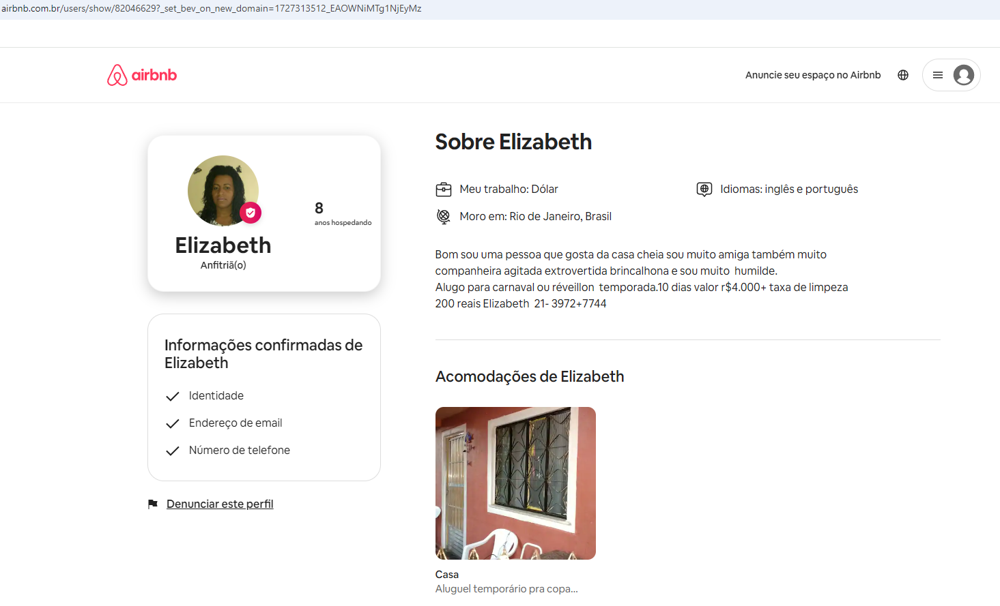

Para excluir esses casos da analise, vamos apagar as linhas em que não review e que não há nenhuma reserva em 365 dias. além de tirar os que não há valores de reserva.


In [ ]:
''' apaga as linhas em que não tem review e que está disponível nos próximos 365 dias
    fica com o inverso das descritas'''

essas_ficam = ~((listings_completo['reviews_per_month'].isna()) & (listings_completo['availability_365'] == 365) & (listings_completo['price'].notna()))
listings_completo = listings_completo[essas_ficam]
listings_completo

## **4) Análise Exploratória(EDA)**

### 4.1 Proporção de disponibilidade por tipos de quartos:

In [ ]:
# Contando a frequência de cada valor único na coluna "room_type"
contagem = listings_completo["room_type"].value_counts().reset_index().head(10)
contagem.columns = ["room_type", "count"]

# Calcular as porcentagens
contagem['percentage'] = (contagem['count'] / contagem['count'].sum()) * 100

# Criar o gráfico de barras com Plotly
fig = px.bar(contagem, x="room_type", y='count',
             labels={"room_type": "Tipo de Quarto", 'count': 'Quantidade de Quartos'},
             title='Quantidade de Quartos por Tipo',
             color_discrete_sequence=['red'],
             text=contagem.apply(lambda row: f'{row["count"]} ({row["percentage"]:.2f}%)', axis=1))

# Ajustar o texto para exibir as porcentagens fora das barras
fig.update_traces(textposition='outside')

# Exibir o gráfico
fig.show()


### 4.2 Tendência de novos hosts durante o ano de 2024

In [ ]:
# Converter para o tipo datetime usando o formato adequado
listings_completo['mes_ano_date'] = pd.to_datetime(listings_completo['mes/ano'], format='%m/%Y')

In [ ]:
hosts_2024 = listings_completo[listings_completo['mes_ano_date'].dt.year == 2024]
len(hosts_2024)

In [474]:
# Filtro para hosts de 2024 até junho
hosts_2024 = listings_completo[(listings_completo['mes_ano_date'].dt.year == 2024) &
                               (listings_completo['mes_ano_date'].dt.month <= 6)]

# Contagem por mês (verifique se está correto usar size ou count)
hosts_por_mes = hosts_2024.groupby(hosts_2024['mes_ano_date'].dt.to_period('M')).size()

# Criando range de meses de janeiro a junho
todos_meses = pd.period_range(start='2024-01', end='2024-06', freq='M')
hosts_por_mes = hosts_por_mes.reindex(todos_meses, fill_value=0)

# Cálculo cumulativo corrigido
hosts_cumulativo = hosts_por_mes.cumsum()

# Conversão dos índices para datetime
hosts_por_mes_index = hosts_por_mes.index.to_timestamp()
hosts_cumulativo_index = hosts_cumulativo.index.to_timestamp()

# Criando gráfico de linha (hosts cumulativos) com Plotly
fig = go.Figure()

# Gráfico de linha (cumulativo)
fig.add_trace(go.Scatter(x=hosts_cumulativo_index, y=hosts_cumulativo.values,
                         mode='lines+markers', name='Total Cumulativo de Hosts',
                         line=dict(color='blue', width=2)))

# Gráfico de barras (novos hosts por mês)
fig.add_trace(go.Bar(x=hosts_por_mes_index, y=hosts_por_mes.values,
                     name='Novos Hosts por Mês', marker=dict(color='orange', opacity=0.6)))

# Atualizando layout do gráfico
fig.update_layout(
    title='Tendência de Novos Hosts de Janeiro a Junho de 2024',
    xaxis_title='Mês',
    yaxis_title='Número Cumulativo de Novos Hosts',
    barmode='overlay',
    xaxis=dict(
        tickmode='array',
        tickvals=hosts_por_mes_index,
        ticktext=[meses_pt[mes.month] for mes in todos_meses] # type: ignore
    ),
    legend=dict(x=0.02, y=0.98, bordercolor="Black", borderwidth=1)
)

# Adicionando a anotação do total de hosts
total_hosts = hosts_cumulativo.iloc[-1]
fig.add_annotation(
    x=hosts_cumulativo_index[-1], y=total_hosts,
    text=f'Total: {total_hosts}',
    showarrow=True, arrowhead=2, arrowsize=1, arrowwidth=1,
    bgcolor='yellow', opacity=0.8
)

# Exibir o gráfico
fig.show()


### 4.3 Bairros que tem mais procura por usuários do Airbnb

In [ ]:
# Dados de exemplo (bairros_stats, semelhante ao seu DataFrame)
bairros_stats = listings_completo.groupby('neighbourhood').agg({
    'number_of_reviews': 'sum',
    'id': 'count'
}).sort_values('number_of_reviews', ascending=False)

# Renomear colunas
bairros_stats.columns = ['Total de Avaliações', 'Número de Listagens']

# Selecionar o Top 10
top_10_bairros = bairros_stats.head(10).reset_index()

# Calcular a porcentagem de Avaliações e Listagens
top_10_bairros['Porcentagem de Avaliações'] = top_10_bairros['Total de Avaliações'] / top_10_bairros['Total de Avaliações'].sum() * 100
top_10_bairros['Porcentagem de Listagens'] = top_10_bairros['Número de Listagens'] / top_10_bairros['Número de Listagens'].sum() * 100

# Criar o gráfico de barras empilhadas
fig = go.Figure()

# Adicionar a barra das Avaliações
fig.add_trace(go.Bar(
    x=top_10_bairros['neighbourhood'],
    y=top_10_bairros['Total de Avaliações'],
    name='Total de Avaliações',
    text=top_10_bairros['Porcentagem de Avaliações'].apply(lambda x: f'{x:.2f}%'),  # Exibir a porcentagem nas barras
    textposition='auto',
    marker_color='rgb(55, 83, 109)'
))

# Adicionar a barra das Listagens
fig.add_trace(go.Bar(
    x=top_10_bairros['neighbourhood'],
    y=top_10_bairros['Número de Listagens'],
    name='Número de Listagens',
    text=top_10_bairros['Porcentagem de Listagens'].apply(lambda x: f'{x:.2f}%'),  # Exibir a porcentagem nas barras
    textposition='auto',
    marker_color='rgb(26, 118, 255)'
))

# Customizar o layout
fig.update_layout(
    title='Top 10 Bairros Mais Procurados no Airbnb',
    xaxis_tickfont_size=14,
    yaxis=dict(
        title='Número de Avaliações / Listagens',
        titlefont_size=16,
        tickfont_size=14,
    ),
    barmode='stack',
    bargap=0.15,  # Espaço entre barras de categorias adjacentes
    bargroupgap=0.1  # Espaço entre barras do mesmo grupo
)

# Exibir o gráfico
fig.show()


### 4.4 Preço médio por bairro

In [ ]:
# Definir um mínimo de imóveis por bairro para entrar na conta
limite_listagens = 500

# Agrupar por bairro, calcular média de preços e contar número de listagens
precos_por_bairro = listings_completo.groupby('neighbourhood')['price'].agg(['mean', 'count'])
precos_por_bairro = precos_por_bairro[precos_por_bairro['count'] >= limite_listagens]

# Ordenar pelos preços médios
precos_por_bairro = precos_por_bairro.sort_values('mean', ascending=False)
precos_por_bairro.columns = ['Preço Médio', 'Número de Listagens']

# Selecionar os top 10 bairros
top_10_bairros = precos_por_bairro.head(10).reset_index()

# Calcular a porcentagem dos preços médios
top_10_bairros['Porcentagem'] = top_10_bairros['Preço Médio'] / top_10_bairros['Preço Médio'].sum() * 100

# Criar o gráfico de barras
fig = go.Figure()

fig.add_trace(go.Bar(
    x=top_10_bairros['neighbourhood'],
    y=top_10_bairros['Preço Médio'],
    text=top_10_bairros['Porcentagem'].apply(lambda x: f'{x:.2f}%'),  # Exibir a porcentagem
    textposition='auto',
    name='Preço Médio',
    marker_color='rgb(26, 118, 255)'  # Cor azul
))

# Customizar o layout
fig.update_layout(
    title='Preço Médio por Bairro (Top 10)',
    xaxis_title='Bairro',
    yaxis_title='Preço Médio (R$)',
    yaxis_tickprefix='R$',
    xaxis_tickangle=-45,
    bargap=0.15,
    bargroupgap=0.1,
    height=600
)

# Exibir o gráfico
fig.show()


### 4.5 Quantidade de locações por hosts


In [ ]:
# Contando a frequência de cada valor único na coluna "room_type"
contagem = listings_completo["host_name"].value_counts().reset_index().head(10)
contagem.columns = ["host_name", "count"]

# Calcular as porcentagens
contagem['percentage'] = (contagem['count'] / contagem['count'].sum()) * 100

# Criar o gráfico de barras com Plotly
fig = px.bar(contagem, x="host_name", y='count',
             labels={"host_name": "nome do host", 'count': 'Quantidade de Quartos'},
             title='TOP 10 Hosts com maior número de locações',
             color_discrete_sequence=['red'],
             text=contagem.apply(lambda row: f'{row["count"]} ({row["percentage"]:.2f}%)', axis=1))

# Ajustar o texto para exibir as porcentagens fora das barras
fig.update_traces(textposition='outside')

# Exibir o gráfico
fig.show()

### 4.6 Análises mensais

#### 4.6.1 Análises de 09/2023

In [ ]:
arq4 = listings_completo[(listings_completo["mes/ano"]=="09/2023")]
arq4.head(2)

In [ ]:
arq4.info()

In [ ]:
print(arq4.isnull().sum())

In [ ]:
# % do Dataset nulo ou não
(arq4.isnull().sum() / arq4.shape[0])*100

In [ ]:
# Agrupar por bairro

arq_group_bairro4 = arq4.groupby('neighbourhood').sum(numeric_only=True)
arq_group_bairro4

In [ ]:
# Quais os bairros com maior número de imóveis no Airbnb?

arq_por_bairro4 = pd.pivot_table(arq4, index='neighbourhood', values='id', aggfunc='count').sort_values(by= 'id', ascending=False)
arq_por_bairro4.head(10)


In [ ]:
# Quais os bairros com maior número de avaliações?

arq_group_bairro4['number_of_reviews'].sort_values(ascending=False).head(10)


In [ ]:
# Quais são os tipos de acomodação, por número?

arq_acomodacoes4 = pd.pivot_table(arq4, index='room_type', values='id', aggfunc='count').sort_values(by='id',ascending=False)
arq_acomodacoes4

#### 4.6.2 Análises de 12/2023

In [ ]:
arq3 = listings_completo[(listings_completo["mes/ano"]=="12/2023")]
arq3.head(2)

In [ ]:
arq3.info()

In [ ]:
arq3.isnull().sum()

In [ ]:
# % do Dataset nulo ou não
(arq3.isnull().sum() / arq3.shape[0])*100

In [ ]:
# Agrupar por bairro

arq_group_bairro3 = arq3.groupby('neighbourhood').sum(numeric_only=True)
arq_group_bairro3.head(3)

In [ ]:
# Quais os bairros com maior número de imóveis no Airbnb?

arq_por_bairro3 = pd.pivot_table(arq3, index='neighbourhood', values='id', aggfunc='count').sort_values(by= 'id', ascending=False)
arq_por_bairro3.head(10)

In [ ]:
# Quais os bairros com maior número de avaliações?

arq_group_bairro3['number_of_reviews'].sort_values(ascending=False).head(10)

In [ ]:
# Quais são os tipos de acomodação, por número?

arq_acomodacoes3 = pd.pivot_table(arq3, index='room_type', values='id', aggfunc='count').sort_values(by='id',ascending=False)
arq_acomodacoes3


#### 4.6.3 Análises de 03/2024


In [ ]:
arq2 = listings_completo[(listings_completo["mes/ano"]=="03/2024")]
arq2.head(2)

In [ ]:
arq2.info()

In [ ]:
arq2.isnull().sum()

In [ ]:
# % do Dataset nulo ou não
(arq2.isnull().sum() / arq2.shape[0])*100

In [ ]:
# Agrupar por bairro

arq_group_bairro2 = arq2.groupby('neighbourhood').sum(numeric_only=True)
arq_group_bairro2.head(3)

In [ ]:
# Quais os bairros com maior número de imóveis no Airbnb?

arq_por_bairro2 = pd.pivot_table(arq2, index='neighbourhood', values='id', aggfunc='count').sort_values(by= 'id', ascending=False)
arq_por_bairro2.head(10)

In [ ]:
# Quais os bairros com maior número de avaliações?

arq_group_bairro2['number_of_reviews'].sort_values(ascending=False).head(10)

In [ ]:
# Quais são os tipos de acomodação, por número?

arq_acomodacoes2 = pd.pivot_table(arq2, index='room_type', values='id', aggfunc='count').sort_values(by='id',ascending=False)
arq_acomodacoes2

#### 4.6.4 Análises de 06/2024


In [ ]:
arq = listings_completo[(listings_completo["mes/ano"]=="06/2024")]
arq.head(2)

In [ ]:
arq.columns

In [ ]:
arq.info()

In [ ]:
arq.isnull().sum()

In [ ]:
# % do Dataset nulo ou não
(arq.isnull().sum() / arq.shape[0])*100

In [ ]:
# Agrupar por bairro

arq_group_bairro = arq.groupby('neighbourhood').sum(numeric_only=True)
arq_group_bairro.tail()

In [ ]:
# Quais os bairros com maior número de imóveis no Airbnb?

arq_por_bairro = pd.pivot_table(arq, index='neighbourhood', values='id', aggfunc='count').sort_values(by= 'id', ascending=False)
arq_por_bairro.head(10)

In [ ]:
# Quais os bairros com maior número de avaliações?

arq_group_bairro['number_of_reviews'].sort_values(ascending=False).head(10)

In [ ]:
# Quais são os tipos de acomodação, por número?

arq_acomodacoes = pd.pivot_table(arq, index='room_type', values='id', aggfunc='count').sort_values(by='id',ascending=False)
arq_acomodacoes

### 4.7 Quantidade de Imóveis para cada bairro por mes/ano

In [ ]:
arq4 = listings_completo[(listings_completo["mes/ano"]=="09/2023")]
arq3 = listings_completo[(listings_completo["mes/ano"]=="12/2023")]
arq2 = listings_completo[(listings_completo["mes/ano"]=="03/2024")]
arq2.head(2)
arq = listings_completo[(listings_completo["mes/ano"]=="06/2024")]
arq.head(2)

arq_por_bairro4 = pd.pivot_table(arq4, index='neighbourhood', values='id', aggfunc='count').sort_values(by= 'id', ascending=False)
arq_por_bairro3 = pd.pivot_table(arq3, index='neighbourhood', values='id', aggfunc='count').sort_values(by= 'id', ascending=False)
arq_por_bairro2 = pd.pivot_table(arq2, index='neighbourhood', values='id', aggfunc='count').sort_values(by= 'id', ascending=False)
arq_por_bairro = pd.pivot_table(arq, index='neighbourhood', values='id', aggfunc='count').sort_values(by= 'id', ascending=False)

compara_imovel = pd.merge(left=arq_por_bairro2, right=arq_por_bairro, how='outer', right_on='neighbourhood', left_on='neighbourhood').sort_values(by=['id_x','id_y'], ascending=False)
compara_imovel.rename(columns={'id_x':"imoveis_por_bairro_29_03_24", 'id_y' : "imoveis_por_bairro_27_06_24" }, inplace=True)
compara_imovel2 = pd.merge(left=arq_por_bairro4, right=arq_por_bairro3, how='outer', right_on='neighbourhood', left_on='neighbourhood').sort_values(by=['id_x','id_y'], ascending=False)
compara_imovel2.rename(columns={'id_x':"imoveis_por_bairro_22_09_23", 'id_y' : "imoveis_por_bairro_26_12_23" }, inplace=True)
compara_imovel_final = pd.concat([compara_imovel2, compara_imovel], axis=1)
compara_imovel_final.head(10)

### 4.8 Quantidade de avaliações por bairro  para cada mes/ano

In [ ]:
arq4 = listings_completo[(listings_completo["mes/ano"]=="09/2023")]
arq3 = listings_completo[(listings_completo["mes/ano"]=="12/2023")]
arq2 = listings_completo[(listings_completo["mes/ano"]=="03/2024")]
arq = listings_completo[(listings_completo["mes/ano"]=="06/2024")]


arq_group_bairro4 = arq4.groupby('neighbourhood').sum(numeric_only=True)
arq_group_bairro3 =  arq3.groupby('neighbourhood').sum(numeric_only=True)
arq_group_bairro2 =  arq2.groupby('neighbourhood').sum(numeric_only=True)
arq_group_bairro =  arq.groupby('neighbourhood').sum(numeric_only=True)


df2_avaliacao = arq_group_bairro2['number_of_reviews'].sort_values(ascending=False).head(10)
df1_avaliacao = arq_group_bairro['number_of_reviews'].sort_values(ascending=False).head(10)
avaliacao_por_bairro = pd.merge(left=df1_avaliacao, right=df2_avaliacao, how='outer', right_on='neighbourhood', left_on='neighbourhood')
avaliacao_por_bairro.rename(columns={'number_of_reviews_x':"reviews_por_bairro_29_03_24", 'number_of_reviews_y' : "reviews_por_bairro_27_06_24" }, inplace=True)
df4_avaliacao = arq_group_bairro4['number_of_reviews'].sort_values(ascending=False).head(10)
df3_avaliacao = arq_group_bairro3['number_of_reviews'].sort_values(ascending=False).head(10)
avaliacao_por_bairro2 = pd.merge(left=df3_avaliacao, right=df4_avaliacao, how='outer', right_on='neighbourhood', left_on='neighbourhood')
avaliacao_por_bairro2.rename(columns={'number_of_reviews_x':"reviews_por_bairro_22_09_23", 'number_of_reviews_y' : "reviews_por_bairro_26_12_23" }, inplace=True)
avaliacao_por_bairro_final = pd.concat([avaliacao_por_bairro2, avaliacao_por_bairro], axis=1)
avaliacao_por_bairro_final

### 4.9 Mudança no tipo de acomodação da cidade por mes/ano

In [ ]:
arq4 = listings_completo[(listings_completo["mes/ano"]=="09/2023")]
arq3 = listings_completo[(listings_completo["mes/ano"]=="12/2023")]
arq2 = listings_completo[(listings_completo["mes/ano"]=="03/2024")]
arq = listings_completo[(listings_completo["mes/ano"]=="06/2024")]



arq_acomodacoes4 = pd.pivot_table(arq4, index='room_type', values='id', aggfunc='count').sort_values(by='id',ascending=False)
arq_acomodacoes3 = pd.pivot_table(arq3, index='room_type', values='id', aggfunc='count').sort_values(by='id',ascending=False)
arq_acomodacoes2 = pd.pivot_table(arq, index='room_type', values='id', aggfunc='count').sort_values(by='id',ascending=False)
arq_acomodacoes = pd.pivot_table(arq, index='room_type', values='id', aggfunc='count').sort_values(by='id',ascending=False)

acomodacoes_mudanca = pd.merge(left=arq_acomodacoes, right=arq_acomodacoes2, how='outer', on='room_type')
acomodacoes_mudanca.rename(columns={'id_x': 'acomodacoes_29_03_24', 'id_y': 'acomodacoes_27_06_24'}, inplace=True)
acomodacoes_mudanca2 = pd.merge(left=arq_acomodacoes4, right=arq_acomodacoes3, how='outer', on='room_type')
acomodacoes_mudanca2.rename(columns={'id_x': 'acomodacoes_22_09_23', 'id_y': 'acomodacoes_26_12_23'}, inplace=True)
acomodacoes_mudanca_final = pd.concat([acomodacoes_mudanca2, acomodacoes_mudanca], axis=1)
acomodacoes_mudanca_final

### 4.10 Quantidade de locações por bairro para cada tipo de quarto para cada mes/ano:

In [ ]:
meses = pd.unique(listings_completo["mes/ano"])

for val in meses:
  contagem = listings_completo[(listings_completo["mes/ano"]==val)].groupby(["neighbourhood","room_type"]).count().reset_index().sort_values(by="id")
  contagem = contagem[["neighbourhood","room_type","id"]]

  fig = px.bar(contagem, x="room_type", y="id",color="neighbourhood",
             labels={"room_type": "tipo_quarto", 'id': 'qtd'},
             title='Quantidade de hospedagens por preço para cada tipo de quarto',
             color_discrete_map= {'Fem':'salmon','Masc':'cornflowerblue'},
             text="id",
             )
  fig.update_traces(texttemplate='%{text}', textposition='outside')
  fig.show()

## **5) Conclusão**

A análise dos dados do Airbnb no Rio de Janeiro revelou que as reservas apresentam um comportamento sazonal, com  valores altos e constantes durante o verão, considerando que esses são meses de alta temporada turística. Bairros como Ipanema, Leblon e Copacabana, conhecidos por sua localização privilegiada e proximidade às praias, se destacam como os mais procurados, com preços médios de locação significativamente mais altos em comparação a bairros como Santa Teresa e Catete, que oferecem opções mais acessíveis. No entanto, não foi observada uma relação direta entre o preço e o número de avaliações recebidas, sugerindo que fatores como a experiência do usuário podem ter maior impacto nas reviews do que o preço em si. Em relação à disponibilidade, a maioria das listagens estava ativa e disponível para locação, embora alguns imóveis não estivessem acessíveis temporariamente. Além disso, um pequeno grupo de hosts com várias propriedades foi responsável por uma parcela significativa das locações, ainda que a maioria dos anúncios pertença a pequenos proprietários. Essas observações oferecem uma visão clara sobre o funcionamento do mercado de locações no Rio, destacando a importância da localização e o comportamento diversificado dos hosts e locatários.